# Aperture Photometry
Notebook dedicated to performing aperture photometry on identified sources of protostellar outflows in the NGC 3324 region of the Carina Nebula.

In [271]:
# use the entire screen width for the notebook
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

In [272]:
# make interactive plots
%matplotlib notebook

In [273]:
# Imports
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import glob # for filepath handling
import sys
#
import warnings
warnings.filterwarnings('ignore')
#
# Astropy:
from astropy.stats import SigmaClip
from astropy.coordinates import SkyCoord
from astropy.io import fits
from astropy.wcs import WCS
from astropy.visualization import LinearStretch, LogStretch, ZScaleInterval, \
    MinMaxInterval, simple_norm
from photutils.aperture import CircularAperture, CircularAnnulus, ApertureStats, aperture_photometry
import reproject as rpj # needed for reproject module

sys.path.append('../code')
from reproject_combine import reproject, make_rgb
from continuum_sub import ContinuumSubtract
import outflow_lookup as ol

In [274]:
path_to_file = '/mnt/c/Users/pjjan/OneDrive - Maynooth University/DIAS/outflow_sources_NGC3324.xlsx' # Set file path of the excel file
dict_ = ol.get_dictionary(path_to_file)

In [275]:
def sort_fnames(file_names):
    """ Function for sorting string lists of file names. Follows JWST naming conventions for naming .fits files."""
    # First get list of integers
    int_ind = []
    for f in file_names:
        num = f[-14:-10]

        if num[0] == 'f': # Accounts for MIRI f1130 band and up
            num = int(num[1:])
        else:
            pass

        int_ind.append(int(num))
    
    # Now sort the list of int returning indices that would sort the array
    sort_indices = np.argsort(int_ind)
    file_arr = np.array(file_names)
    sorted_fnames = file_arr[sort_indices] # re-arrange fnames
    
    return sorted_fnames # returns array of sorted fnames

In [276]:
# Get image directory and get files for imaging and plot generation
img_dir = '/mnt/d/st_images/Carina_level3/'
files = glob.glob(img_dir+'*')[3:] # Gets all JWST images including MIRI, excluding folders
files = sort_fnames(files) # sort them in ascending wavelength number
print('Files found:')
for f in files:
    print(f)

Files found:
/mnt/d/st_images/Carina_level3/jw02731-o001_t017_nircam_clear-f090w_i2d.fits
/mnt/d/st_images/Carina_level3/jw02731-o001_t017_nircam_clear-f187n_i2d.fits
/mnt/d/st_images/Carina_level3/jw02731-o001_t017_nircam_clear-f200w_i2d.fits
/mnt/d/st_images/Carina_level3/jw02731-o001_t017_nircam_clear-f335m_i2d.fits
/mnt/d/st_images/Carina_level3/jw02731-o001_t017_nircam_clear-f444w_i2d.fits
/mnt/d/st_images/Carina_level3/jw02731-o001_t017_nircam_f444w-f470n_i2d.fits
/mnt/d/st_images/Carina_level3/jw02731-o002_t017_miri_f770w_i2d.fits
/mnt/d/st_images/Carina_level3/jw02731-o002_t017_miri_f1130w_i2d.fits
/mnt/d/st_images/Carina_level3/jw02731-o002_t017_miri_f1280w_i2d.fits
/mnt/d/st_images/Carina_level3/jw02731-o002_t017_miri_f1800w_i2d.fits


In [277]:
# Set target header/data for reprojection
with fits.open(files[5]) as hdu:
    tar_header = hdu[1].header
    tar_data = hdu[1].data

target_wcs = WCS(tar_header)

In [278]:
# Reproject all image files onto target image (F444W-F470N)
reproj = reproject(files, target_wcs, tar_data)

We will now do a similar process to what was done in the [Source Images Notebook](https://github.com/pjjanas/dias-jwst/blob/main/notebooks/Source_Images.ipynb) to get the pixel values for aperture photometry. We will crop the reprojected images and then do the photometry on the products. Using sky coordinates would be optimal, but this batch of MIRI images from JWST had incorrect WCS header information and so the reprojected images are slightly offset from the NIRCam images. So we must result to using pixel values rather than coordinates for aperture setting. Also, we will work with individual sources rather than setting apertures on the full image.

# source-1 (PJ001)
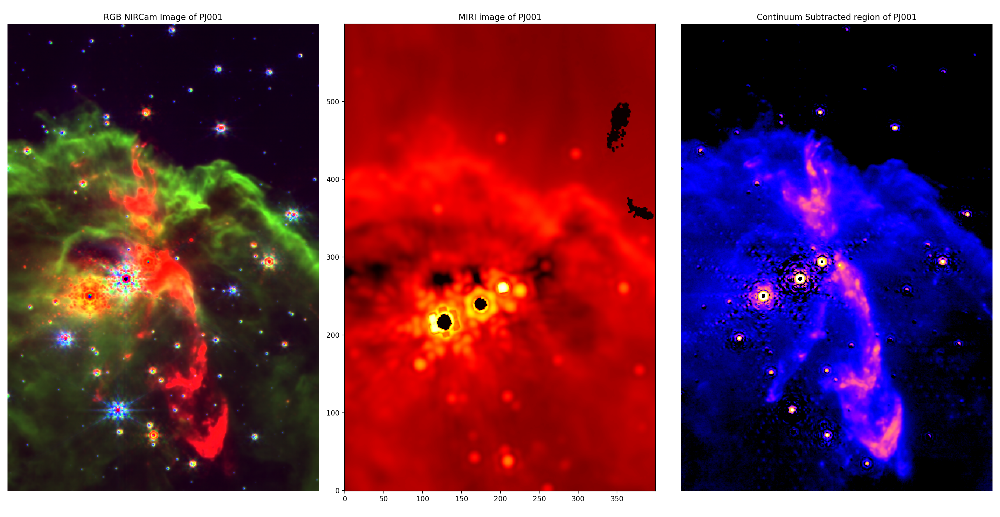

In [325]:
focus = 'PJ001' # set desired focus
coords = ol.get_coordinates(path_to_file, focus) # Get coordinates of the source from the excel file
pixel_x, pixel_y = target_wcs.world_to_pixel(coords) # get pixel coordinates of the outflow
pixel_x, pixel_y = int(pixel_x), int(pixel_y)
region = ol.pixel_region(pixel_x, pixel_y, custom_bounds=(200,200,300,300))

# Crop images onto desired region
cropped = ol.crop_images(reproj, region)
data = cropped[-1] # F1800W MIRI image as data

We will place an aperture on the theorised host star on the MIRI image along with an annulus and plot it below to confirm we have a correct radius set.

## Other possible source of PJ001
The exact source of **PJ001** is not clear. So we will also perform astro-photometry on the nearby star, another possible source.

In [326]:
pos = [(225, 257), (212, 237)] # set central positions of apertures
apertures = CircularAperture(pos, r=11)
annulus = CircularAnnulus(pos, r_in=20, r_out=25)

<IPython.core.display.Javascript object>


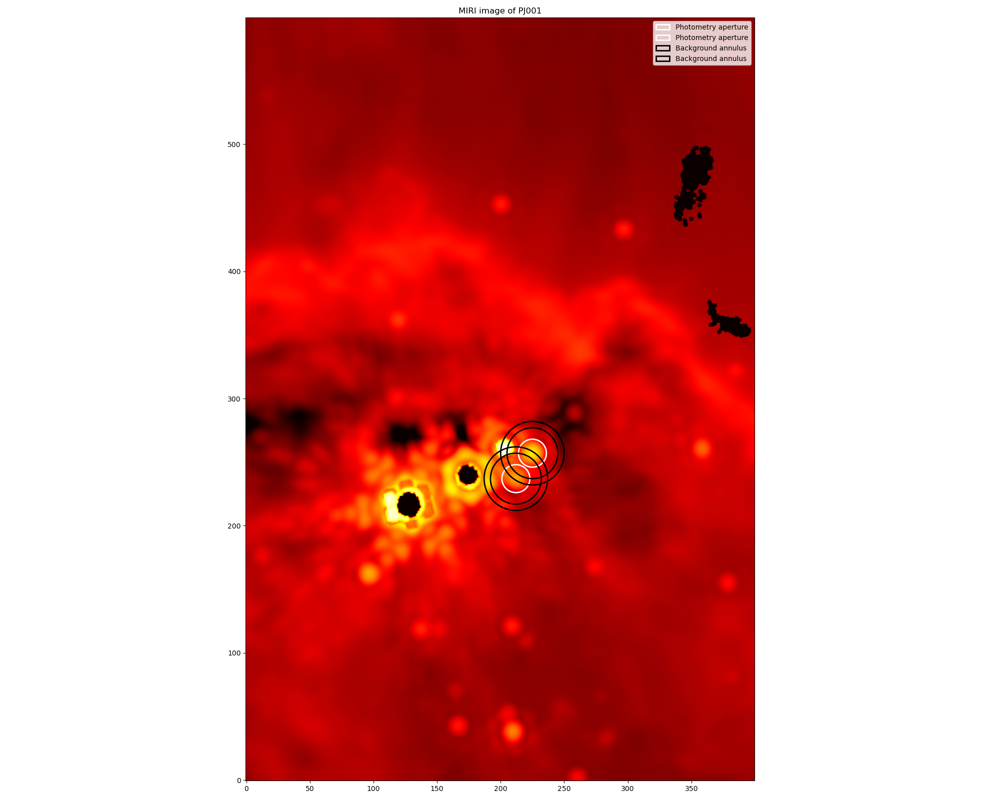

In [327]:
fig, axs = plt.subplots(1,1)
fig.set_size_inches(20, 16)

axs.imshow(cropped[-1], origin='lower', norm = simple_norm(cropped[-1], stretch='log', invalid=0, min_cut=170), cmap='hot')
axs.set_title(f'MIRI image of {focus}')

ap_patch = apertures.plot(color='w', lw=2, label='Photometry aperture')
ann_patch = annulus.plot(color='k', lw=2, label='Background annulus')
plt.legend(loc='best')
plt.tight_layout()

In [328]:
# Get stats on background, so we can subtract it. (Local Background Subtraction)
sigclip = SigmaClip(sigma=1, maxiters=10) # sigma clip due to bright star in annulus
bkg_stats = ApertureStats(data, annulus, sigma_clip=sigclip)
aper_stats = ApertureStats(data, apertures)
aper_stats_bkgsub = ApertureStats(data, apertures, local_bkg=bkg_stats.median) # Take the background median away from data
bkg_median = bkg_stats.median
print('Median of apertures:')
print(bkg_median)

Median of apertures:
[208.03504371 263.24858004]


We now have aperture statistics both with and without background. Now a table of properties is made for the apertures above.

In [329]:
# Print a table with full list of properties
t = aper_stats_bkgsub.to_table()
for col in t.colnames:
    if col == 'sky_centroid':
        pass
    else:
        t[col].info.format = '%.8g'
t['id'][:] = [1, 1]
t.show_in_notebook()

idx,id,xcentroid,ycentroid,sky_centroid,sum,sum_err,sum_aper_area,center_aper_area,min,max,mean,median,mode,std,mad_std,var,biweight_location,biweight_midvariance,fwhm,semimajor_sigma,semiminor_sigma,orientation,eccentricity
,,,,,,,pix2,pix2,,,,,,,,,,,pix,pix,pix,deg,
0,1,224.64795,257.03172,None,199298.02,nan,380.13271,373,59.893754,1477.7771,532.52638,418.67082,190.95971,377.58162,342.12646,142567.88,457.10555,144541.84,10.045137,4.2810023,4.250497,-14.90828,0.11916657
1,1,211.36115,238.22758,None,101359.96,nan,380.13271,373,-36.980902,658.35368,269.91284,253.7469,221.41501,176.41076,200.96562,31120.757,262.11974,33455.833,10.384923,4.8026251,3.9789748,-28.121526,0.5599891


In [330]:
mask = apertures.to_mask()
values_1 = []
for i, _ in enumerate(apertures): 
    val = mask[i].get_values(data) # get all values for the aperture if needed.
    values_1.append(val)

# source-6 (PJ006)
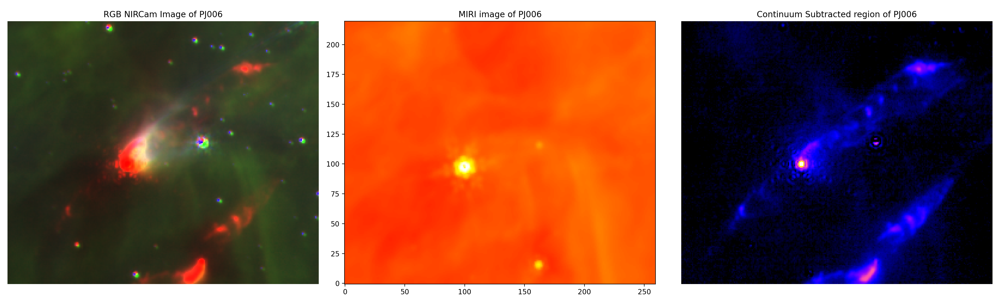

In [285]:
focus = 'PJ006' # set desired focus
coords = ol.get_coordinates(path_to_file, focus) # Get coordinates of the source from the excel file
pixel_x, pixel_y = target_wcs.world_to_pixel(coords) # get pixel coordinates of the outflow
pixel_x, pixel_y = int(pixel_x), int(pixel_y)
region = ol.pixel_region(pixel_x, pixel_y, custom_bounds=(100,160,100,120))

# Crop images onto desired region
cropped = ol.crop_images(reproj, region)
data = cropped[7] # F1130W MIRI image as data

In [286]:
pos = (100, 97.5) # set central positions of apertures
aperture = CircularAperture(pos, r=8)
annulus = CircularAnnulus(pos, r_in=20, r_out=25)

<IPython.core.display.Javascript object>


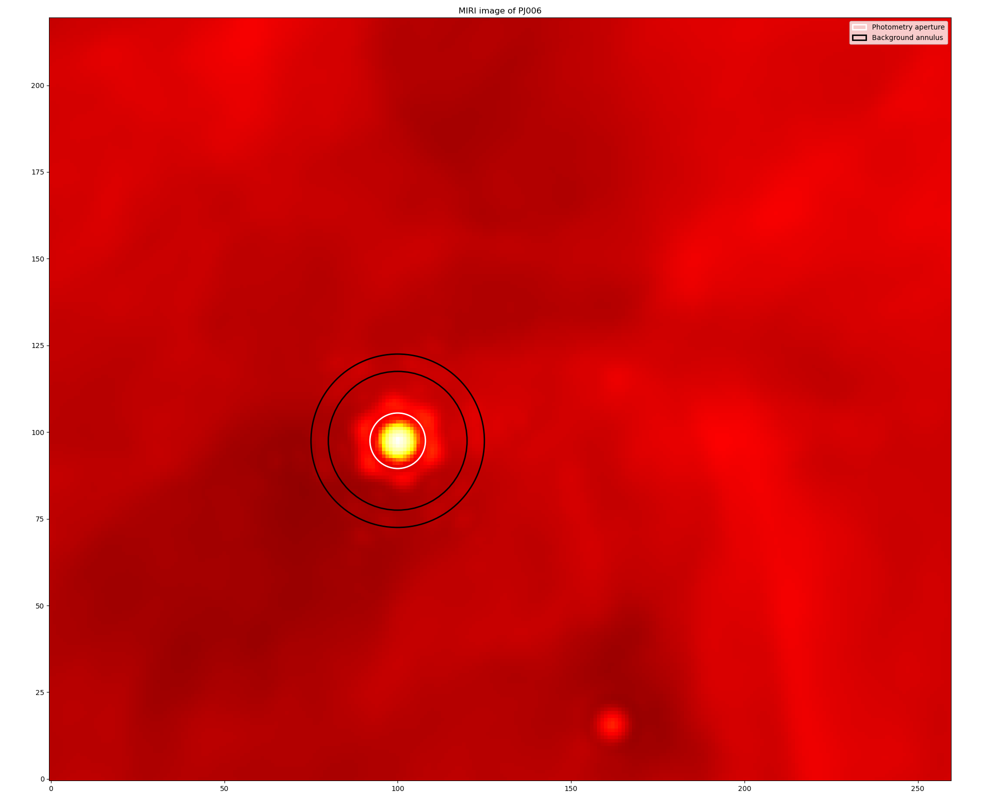

In [287]:
fig, axs = plt.subplots(1,1)
fig.set_size_inches(20, 16)

axs.imshow(cropped[7], origin='lower', norm = simple_norm(cropped[7], stretch='log', log_a=50, invalid=0, min_cut=0), cmap='hot')
axs.set_title(f'MIRI image of {focus}')

ap_patch = aperture.plot(color='w', lw=2, label='Photometry aperture')
ann_patch = annulus.plot(color='k', lw=2, label='Background annulus')
plt.legend(loc='best')
plt.tight_layout()

In [288]:
# Get stats on background, so we can subtract it. (Local Background Subtraction)
bkg_stats = ApertureStats(data, annulus)
aper_stats = ApertureStats(data, aperture)
aper_stats_bkgsub = ApertureStats(data, aperture, local_bkg=bkg_stats.median) # Take the background median away from data
bkg_median = bkg_stats.median
print('Median of apertures:')
print(bkg_median)

Median of apertures:
65.2595795804639


In [289]:
# Print a table with full list of properties
t = aper_stats_bkgsub.to_table()
for col in t.colnames:
    if col == 'sky_centroid':
        pass
    else:
        t[col].info.format = '%.8g'
t['id'][:] = [6]
t.show_in_notebook()

idx,id,xcentroid,ycentroid,sky_centroid,sum,sum_err,sum_aper_area,center_aper_area,min,max,mean,median,mode,std,mad_std,var,biweight_location,biweight_midvariance,fwhm,semimajor_sigma,semiminor_sigma,orientation,eccentricity
,,,,,,,pix2,pix2,,,,,,,,,,,pix,pix,pix,deg,
0,6,100.21559,97.417244,None,83251.832,nan,201.06193,196,21.493324,1696.735,423.51565,192.07574,-270.8041,460.19679,227.57638,211781.08,185.01659,133044.29,6.1085846,2.6111375,2.5769037,53.688508,0.1613985


In [290]:
mask = aperture.to_mask()
values_6 = mask.get_values(data) # get all values for the aperture if needed.

# source-7 (PJ007)
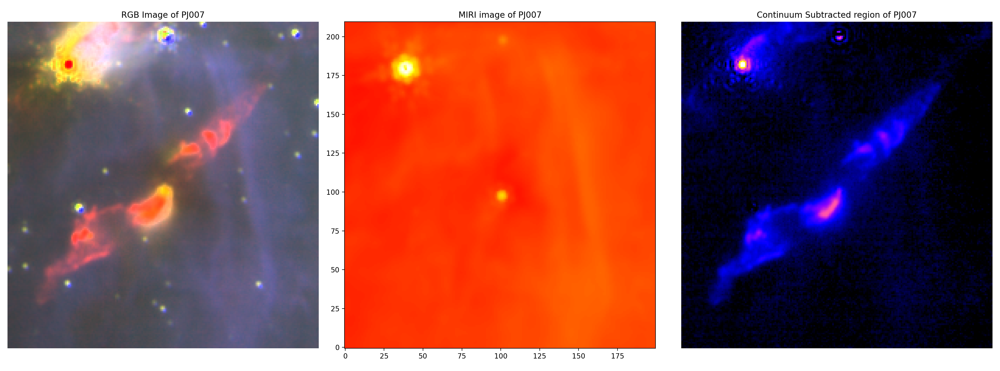

In [291]:
focus = 'PJ007' # set desired focus
coords = ol.get_coordinates(path_to_file, focus) # Get coordinates of the source from the excel file
pixel_x, pixel_y = target_wcs.world_to_pixel(coords) # get pixel coordinates of the outflow
pixel_x, pixel_y = int(pixel_x), int(pixel_y)
region = ol.pixel_region(pixel_x, pixel_y, custom_bounds=(100,100,100,110))

# Crop images onto desired region
cropped = ol.crop_images(reproj, region)
data = cropped[6] # F770W MIRI image as data

In [292]:
pos = (101, 97.5) # set central positions of apertures
aperture = CircularAperture(pos, r=7)
annulus = CircularAnnulus(pos, r_in=20, r_out=25)

<IPython.core.display.Javascript object>


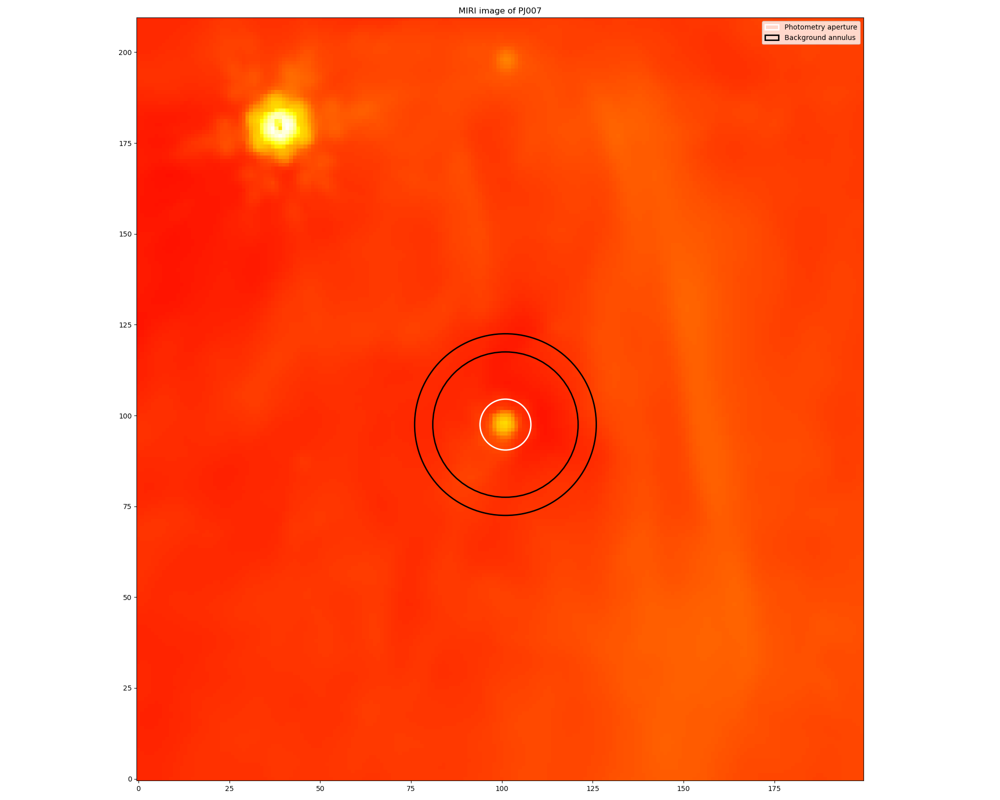

In [293]:
fig, axs = plt.subplots(1,1)
fig.set_size_inches(20, 16)

axs.imshow(cropped[6], origin='lower', norm = simple_norm(cropped[6], stretch='log', invalid=0, min_cut=0), cmap='hot')
axs.set_title(f'MIRI image of {focus}')

ap_patch = aperture.plot(color='w', lw=2, label='Photometry aperture')
ann_patch = annulus.plot(color='k', lw=2, label='Background annulus')
plt.legend(loc='best')
plt.tight_layout()

In [294]:
# Get stats on background, so we can subtract it. (Local Background Subtraction)
bkg_stats = ApertureStats(data, annulus)
aper_stats = ApertureStats(data, aperture)
aper_stats_bkgsub = ApertureStats(data, aperture, local_bkg=bkg_stats.median) # Take the background median away from data
bkg_median = bkg_stats.median
print('Median of apertures:')
print(bkg_median)

Median of apertures:
44.02225540420005


In [295]:
# Print a table with full list of properties
t = aper_stats_bkgsub.to_table()
for col in t.colnames:
    if col == 'sky_centroid':
        pass
    else:
        t[col].info.format = '%.8g'
t['id'][:] = [7]
t.show_in_notebook()

idx,id,xcentroid,ycentroid,sky_centroid,sum,sum_err,sum_aper_area,center_aper_area,min,max,mean,median,mode,std,mad_std,var,biweight_location,biweight_midvariance,fwhm,semimajor_sigma,semiminor_sigma,orientation,eccentricity
,,,,,,,pix2,pix2,,,,,,,,,,,pix,pix,pix,deg,
0,7,100.43128,97.296248,None,5978.7878,nan,153.93804,154,-3.12337,225.61715,38.865214,14.690403,-33.65922,54.456128,20.561371,2965.4699,13.124338,512.04316,4.8571348,2.1740089,1.9448943,72.700345,0.44684391


In [296]:
mask = aperture.to_mask()
values_7 = mask.get_values(data) # get all values for the aperture if needed.

# source-11
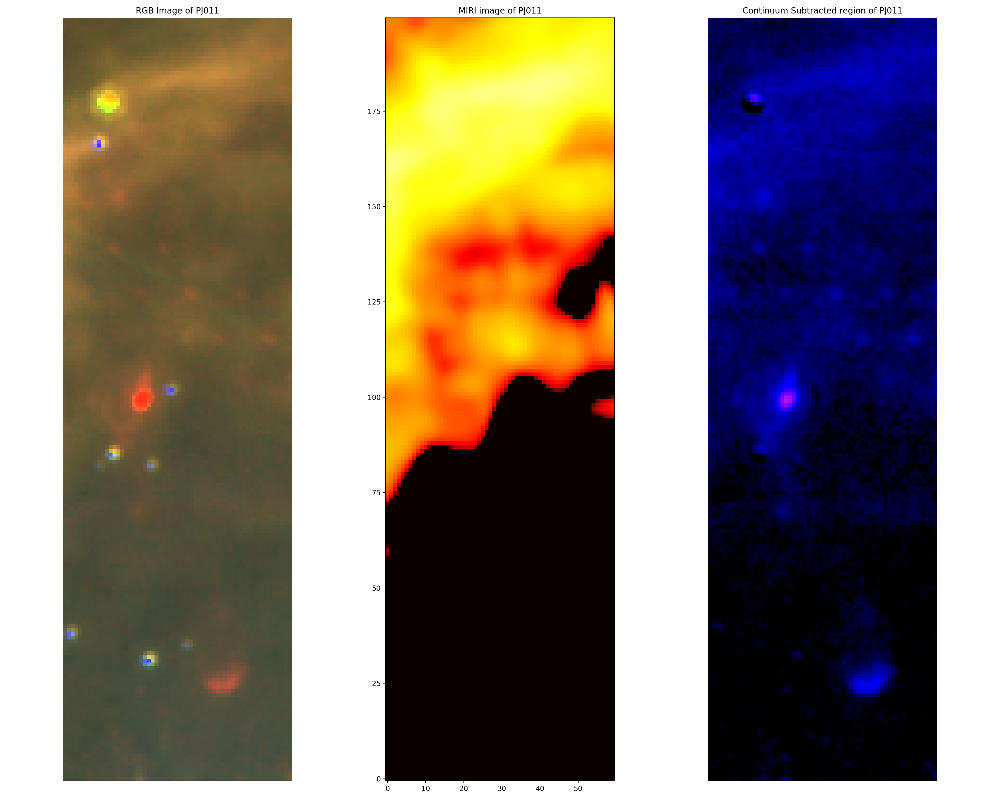

In [297]:
focus = 'PJ011' # set desired focus
coords = ol.get_coordinates(path_to_file, focus) # Get coordinates of the source from the excel file
pixel_x, pixel_y = target_wcs.world_to_pixel(coords) # get pixel coordinates of the outflow
pixel_x, pixel_y = int(pixel_x), int(pixel_y)
region = ol.pixel_region(pixel_x, pixel_y, custom_bounds=(20,40,100,100))

# Crop images onto desired region
cropped = ol.crop_images(reproj, region)
data = cropped[5] # F444w-F470N MIRI image as data

In [298]:
pos = (20, 101) # set central positions of apertures
aperture = CircularAperture(pos, r=7)
annulus = CircularAnnulus(pos, r_in=20, r_out=25)

<IPython.core.display.Javascript object>


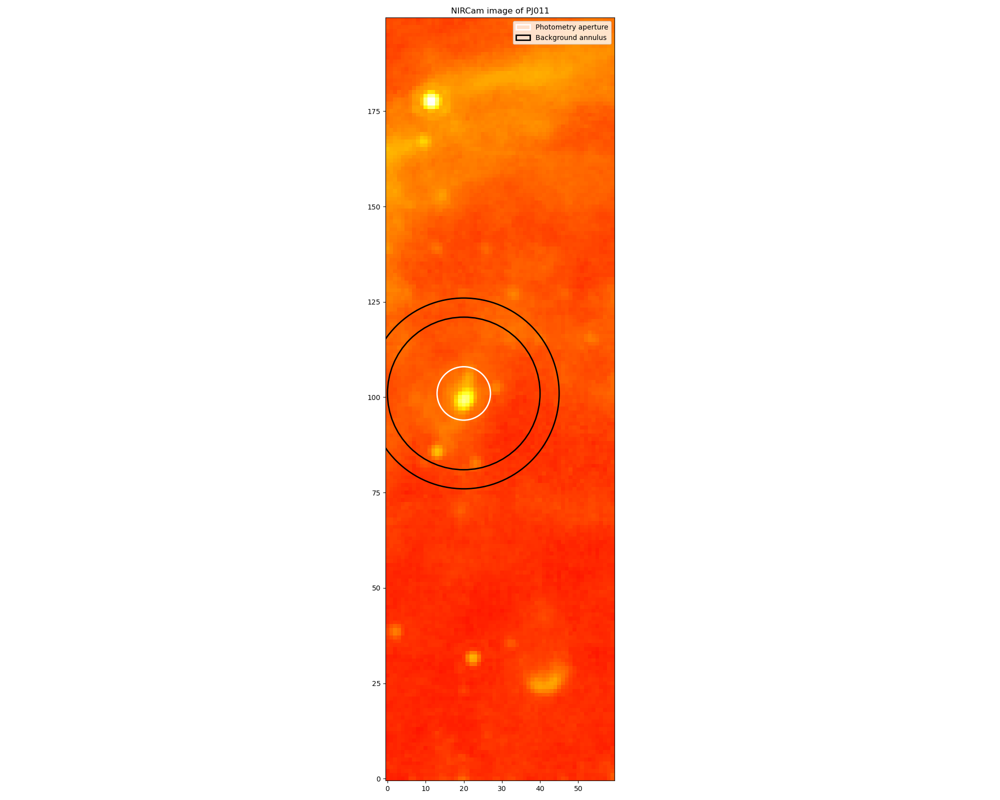

In [299]:
fig, axs = plt.subplots(1,1)
fig.set_size_inches(20, 16)

axs.imshow(cropped[5], origin='lower', norm = simple_norm(cropped[5], stretch='log', log_a=100, invalid=0, min_cut=0), cmap='hot')
axs.set_title(f'NIRCam image of {focus}')

ap_patch = aperture.plot(color='w', lw=2, label='Photometry aperture')
ann_patch = annulus.plot(color='k', lw=2, label='Background annulus')
plt.legend(loc='best')
plt.tight_layout()

In [300]:
# Get stats on background, so we can subtract it. (Local Background Subtraction)
bkg_stats = ApertureStats(data, annulus)
aper_stats = ApertureStats(data, aperture)
aper_stats_bkgsub = ApertureStats(data, aperture, local_bkg=bkg_stats.median) # Take the background median away from data
bkg_median = bkg_stats.median
print('Median of apertures:')
print(bkg_median)

Median of apertures:
3.8300027848709877


In [301]:
# Print a table with full list of properties
t = aper_stats_bkgsub.to_table()
for col in t.colnames:
    if col == 'sky_centroid':
        pass
    else:
        t[col].info.format = '%.8g'
t['id'][:] = [11]
t.show_in_notebook()

idx,id,xcentroid,ycentroid,sky_centroid,sum,sum_err,sum_aper_area,center_aper_area,min,max,mean,median,mode,std,mad_std,var,biweight_location,biweight_midvariance,fwhm,semimajor_sigma,semiminor_sigma,orientation,eccentricity
,,,,,,,pix2,pix2,,,,,,,,,,,pix,pix,pix,deg,
0,11,20.107608,100.23149,None,508.73438,nan,153.93804,145,0.55108643,23.780744,3.4546956,1.6988482,-1.8128465,4.4870615,1.2155312,20.133721,1.6680746,1.6352252,5.6675505,2.6316113,2.1586732,77.863046,0.57195397


In [302]:
mask = aperture.to_mask()
values_11 = mask.get_values(data) # get all values for the aperture if needed.

# source-12 (PJ012)
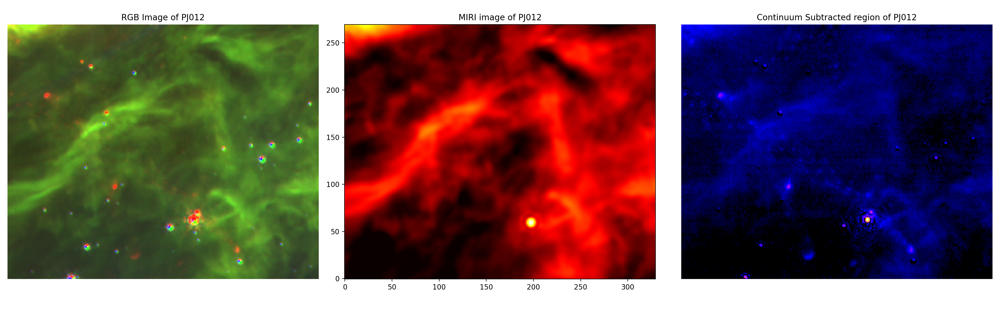

We will use a NIRCam image to perform photometry on the star as the theorised source is unresolved in the MIRI image.

In [303]:
focus = 'PJ012' # set desired focus
coords = ol.get_coordinates(path_to_file, focus) # Get coordinates of the source from the excel file
pixel_x, pixel_y = target_wcs.world_to_pixel(coords) # get pixel coordinates of the outflow
pixel_x, pixel_y = int(pixel_x), int(pixel_y)
region = ol.pixel_region(pixel_x, pixel_y, custom_bounds=(200,130,70,200))

# Crop images onto desired region
cropped = ol.crop_images(reproj, region)
data = cropped[4] # F444W NIRCam image as data

In [304]:
pos = (200.7, 69.5) # set central positions of apertures
aperture = CircularAperture(pos, r=5)
annulus = CircularAnnulus(pos, r_in=10, r_out=15)

<IPython.core.display.Javascript object>


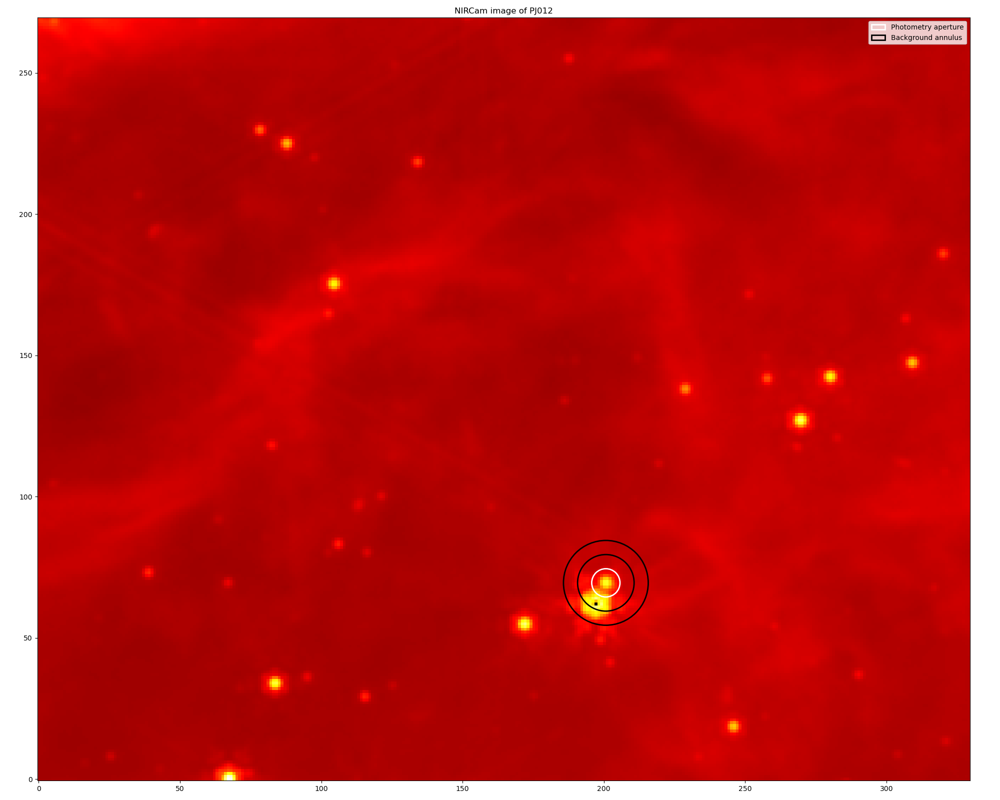

In [305]:
fig, axs = plt.subplots(1,1)
fig.set_size_inches(20, 16)

axs.imshow(cropped[4], origin='lower', norm = simple_norm(cropped[4], stretch='log', log_a=100, invalid=0, min_cut=0), cmap='hot')
axs.set_title(f'NIRCam image of {focus}')

ap_patch = aperture.plot(color='w', lw=2, label='Photometry aperture')
ann_patch = annulus.plot(color='k', lw=2, label='Background annulus')
plt.legend(loc='best')
plt.tight_layout()

In [306]:
# Get stats on background, so we can subtract it. (Local Background Subtraction)
bkg_stats = ApertureStats(data, annulus)
aper_stats = ApertureStats(data, aperture)
aper_stats_bkgsub = ApertureStats(data, aperture, local_bkg=bkg_stats.median) # Take the background median away from data
bkg_median = bkg_stats.median
print('Median of apertures:')
print(bkg_median)

Median of apertures:
4.415185632299349


In [307]:
# Print a table with full list of properties
t = aper_stats_bkgsub.to_table()
for col in t.colnames:
    if col == 'sky_centroid':
        pass
    else:
        t[col].info.format = '%.8g'
t['id'][:] = [12]
t.show_in_notebook()

idx,id,xcentroid,ycentroid,sky_centroid,sum,sum_err,sum_aper_area,center_aper_area,min,max,mean,median,mode,std,mad_std,var,biweight_location,biweight_midvariance,fwhm,semimajor_sigma,semiminor_sigma,orientation,eccentricity
,,,,,,,pix2,pix2,,,,,,,,,,,pix,pix,pix,deg,
0,12,200.395,68.675593,None,904.25068,nan,78.539816,80,0.54449136,50.446881,11.275133,6.1804632,-4.0088763,12.208764,6.4791629,149.05391,6.2931918,69.367866,4.4475632,2.1037845,1.645756,67.028389,0.62292254


In [308]:
mask = aperture.to_mask()
values_12 = mask.get_values(data) # get all values for the aperture if needed.

# source-19 (PJ019)
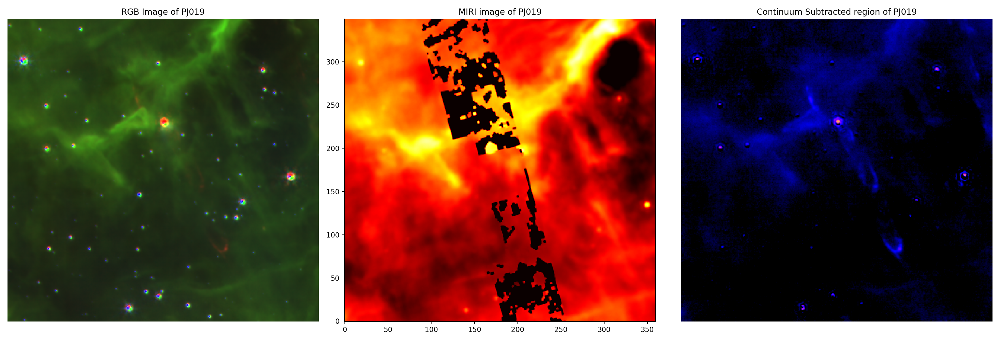

We will once again use a NIRCam image to perform photometry on the star for similar reasons listed above.

In [309]:
focus = 'PJ019' # set desired focus
coords = ol.get_coordinates(path_to_file, focus) # Get coordinates of the source from the excel file
pixel_x, pixel_y = target_wcs.world_to_pixel(coords) # get pixel coordinates of the outflow
pixel_x, pixel_y = int(pixel_x), int(pixel_y)
region = ol.pixel_region(pixel_x, pixel_y, custom_bounds=(180, 180, 230, 120))

# Crop images onto desired region
cropped = ol.crop_images(reproj, region)
data = cropped[5] # F444W-F470N NIRCam image as data

In [310]:
pos = (181, 230) # set central positions of apertures
aperture = CircularAperture(pos, r=6.5)
annulus = CircularAnnulus(pos, r_in=15, r_out=20)

<IPython.core.display.Javascript object>


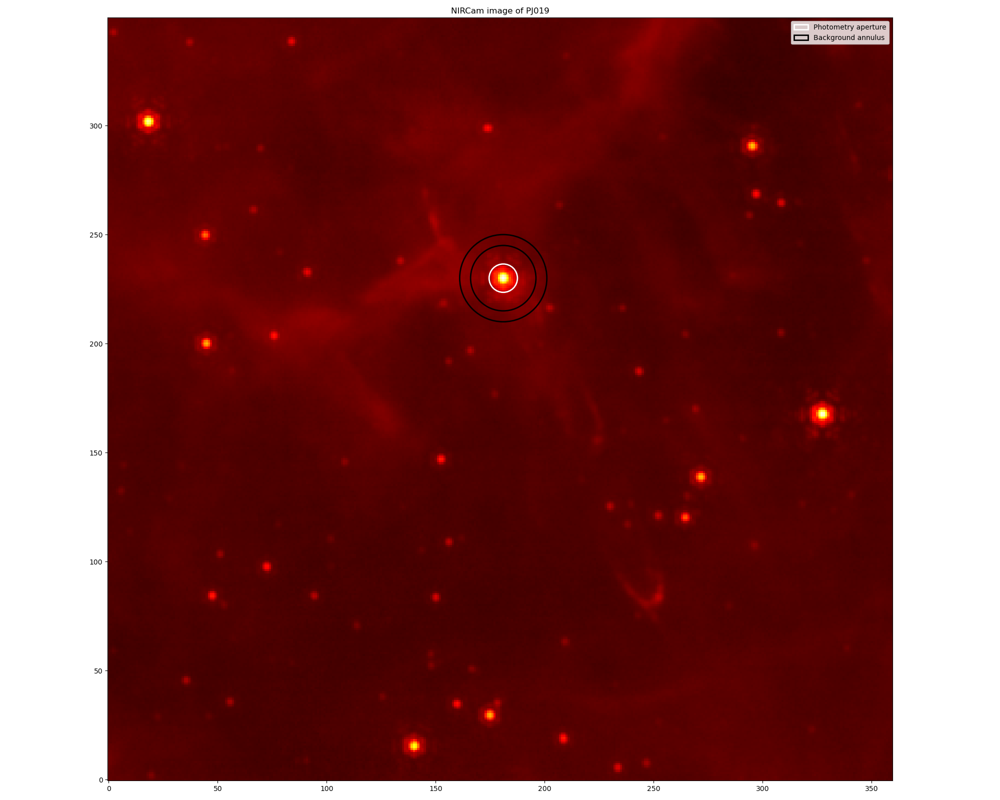

In [311]:
fig, axs = plt.subplots(1,1)
fig.set_size_inches(20, 16)

axs.imshow(cropped[5], origin='lower', norm = simple_norm(cropped[5], stretch='log', log_a=100, invalid=0, min_cut=0), cmap='hot')
axs.set_title(f'NIRCam image of {focus}')

ap_patch = aperture.plot(color='w', lw=2, label='Photometry aperture')
ann_patch = annulus.plot(color='k', lw=2, label='Background annulus')
plt.legend(loc='best')
plt.tight_layout()

In [312]:
# Get stats on background, so we can subtract it. (Local Background Subtraction)
bkg_stats = ApertureStats(data, annulus)
aper_stats = ApertureStats(data, aperture)
aper_stats_bkgsub = ApertureStats(data, aperture, local_bkg=bkg_stats.median) # Take the background median away from data
bkg_median = bkg_stats.median
print('Median of apertures:')
print(bkg_median)

Median of apertures:
6.3362054824580145


In [313]:
# Print a table with full list of properties
t = aper_stats_bkgsub.to_table()
for col in t.colnames:
    if col == 'sky_centroid':
        pass
    else:
        t[col].info.format = '%.8g'
t['id'][:] = [19]
t.show_in_notebook()

idx,id,xcentroid,ycentroid,sky_centroid,sum,sum_err,sum_aper_area,center_aper_area,min,max,mean,median,mode,std,mad_std,var,biweight_location,biweight_midvariance,fwhm,semimajor_sigma,semiminor_sigma,orientation,eccentricity
,,,,,,,pix2,pix2,,,,,,,,,,,pix,pix,pix,deg,
0,19,180.99854,229.92063,None,8012.0443,nan,132.73229,137,2.6338282,619.32334,58.705601,22.743081,-49.181959,106.11895,18.238401,11261.231,21.039975,230.36521,4.5488289,1.9884151,1.8732888,-33.716833,0.33532792


In [314]:
mask = aperture.to_mask()
values_19 = mask.get_values(data) # get all values for the aperture if needed.

# source-21 (PJ021)

In [315]:
focus = 'PJ021' # set desired focus
coords = ol.get_coordinates(path_to_file, focus) # Get coordinates of the source from the excel file
pixel_x, pixel_y = target_wcs.world_to_pixel(coords) # get pixel coordinates of the outflow
pixel_x, pixel_y = int(pixel_x), int(pixel_y)
region = ol.pixel_region(pixel_x, pixel_y, custom_bounds=(50, 50, 80, 50))

# Crop images onto desired region
cropped = ol.crop_images(reproj, region)
data = cropped[5] # F444W-F470N NIRCam image as data

In [316]:
pos = (50, 80) # set central positions of apertures
aperture = CircularAperture(pos, r=6.5)
annulus = CircularAnnulus(pos, r_in=15, r_out=20)

<IPython.core.display.Javascript object>


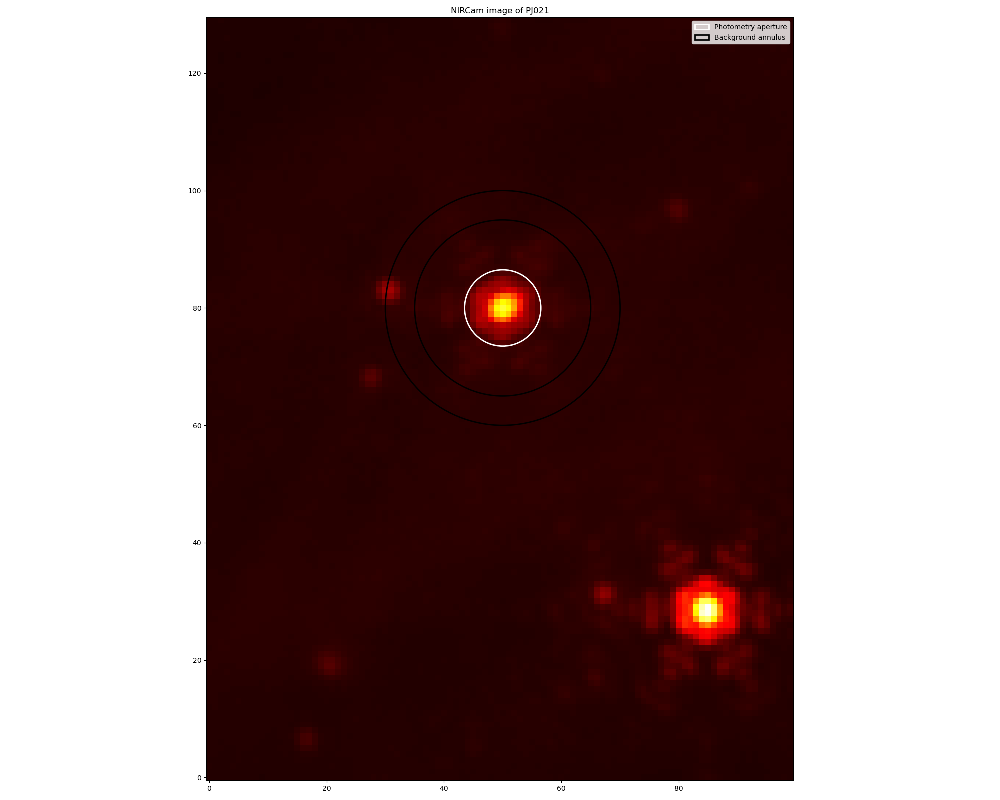

In [317]:
fig, axs = plt.subplots(1,1)
fig.set_size_inches(20, 16)

axs.imshow(cropped[5], origin='lower', norm = simple_norm(cropped[5], stretch='log', log_a=100, invalid=0, min_cut=0), cmap='hot')
axs.set_title(f'NIRCam image of {focus}')

ap_patch = aperture.plot(color='w', lw=2, label='Photometry aperture')
ann_patch = annulus.plot(color='k', lw=2, label='Background annulus')
plt.legend(loc='best')
plt.tight_layout()

In [318]:
# Get stats on background, so we can subtract it. (Local Background Subtraction)
bkg_stats = ApertureStats(data, annulus)
aper_stats = ApertureStats(data, aperture)
aper_stats_bkgsub = ApertureStats(data, aperture, local_bkg=bkg_stats.median) # Take the background median away from data
bkg_median = bkg_stats.median
print('Median of apertures:')
print(bkg_median)

Median of apertures:
6.042018890394292


In [319]:
# Print a table with full list of properties
t = aper_stats_bkgsub.to_table()
for col in t.colnames:
    if col == 'sky_centroid':
        pass
    else:
        t[col].info.format = '%.8g'
t['id'][:] = [21]
t.show_in_notebook()

idx,id,xcentroid,ycentroid,sky_centroid,sum,sum_err,sum_aper_area,center_aper_area,min,max,mean,median,mode,std,mad_std,var,biweight_location,biweight_midvariance,fwhm,semimajor_sigma,semiminor_sigma,orientation,eccentricity
,,,,,,,pix2,pix2,,,,,,,,,,,pix,pix,pix,deg,
0,21,50.114178,80.076724,None,11595.686,nan,132.73229,137,3.0185566,873.9686,84.843793,26.077065,-91.456392,158.7293,25.243041,25194.991,24.37525,466.72468,4.2764769,1.9086673,1.7184536,16.537951,0.43518276


In [320]:
mask = aperture.to_mask()
values_21 = mask.get_values(data) # get all values for the aperture if needed.